We'll start by trying to segment at least a portion of the images we have for better labelling

In [10]:
#%pip install opencv-python

In [36]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage.filters import threshold_otsu

In [14]:
path = './data/43290879-American_Samoa/43290879-American_Samoa-226594/43290879-American_Samoa-226594-0003.jpg'

In [37]:
img = cv2.imread(path)

In [38]:
img.shape[0:2]

(3426, 3362)

In [39]:
gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

In [40]:
_,thresh = cv2.threshold(gray, np.mean(gray), 255, cv2.THRESH_BINARY_INV)
edges = cv2.dilate(cv2.Canny(thresh,0,255), None)

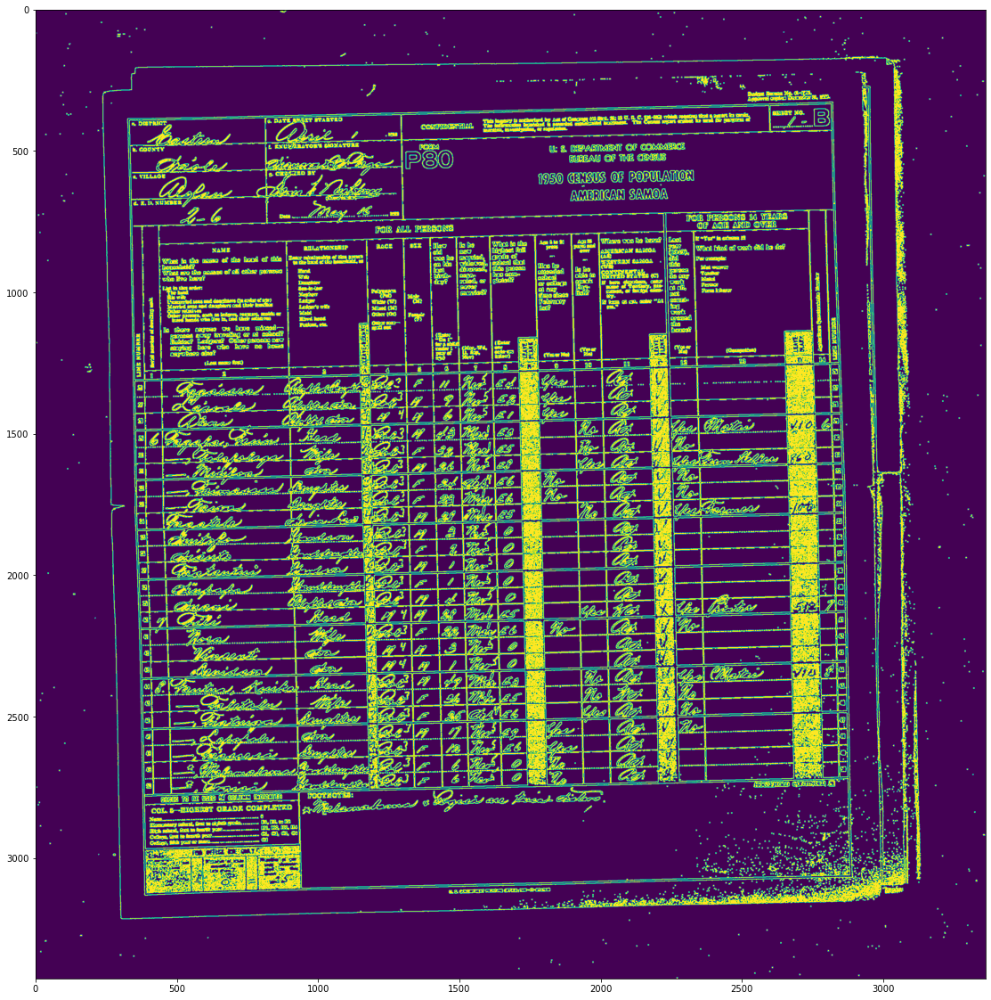

In [41]:
plt.figure(figsize=(20,20))
plt.imshow(edges)

In [42]:
cnt = sorted(cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[-2], key = cv2.contourArea)[-1]
mask = np.zeros(gray.shape[0:2],np.uint8)
masked = cv2.drawContours(mask, [cnt],-1,255,-1)

In [43]:
dst = cv2.bitwise_and(img,img, mask=masked)
segmented = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

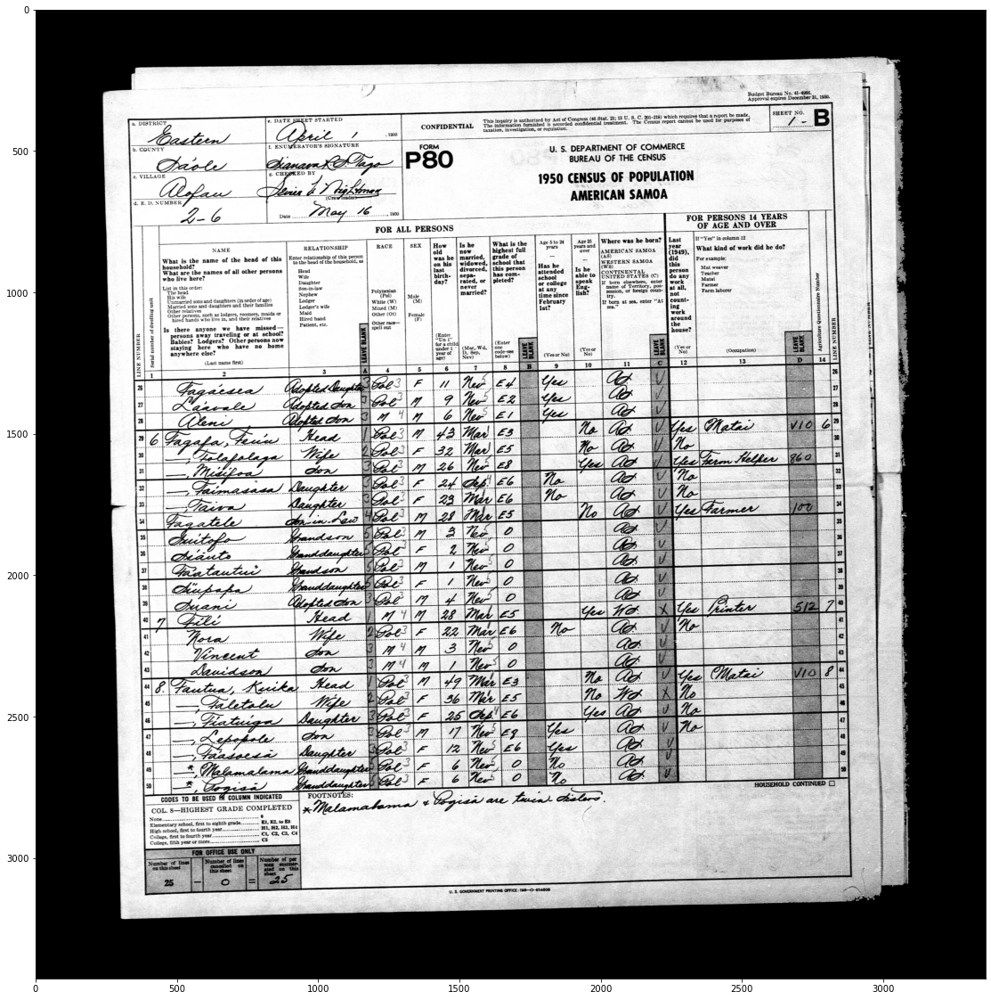

In [44]:
plt.figure(figsize=(20,20))
plt.imshow(segmented)

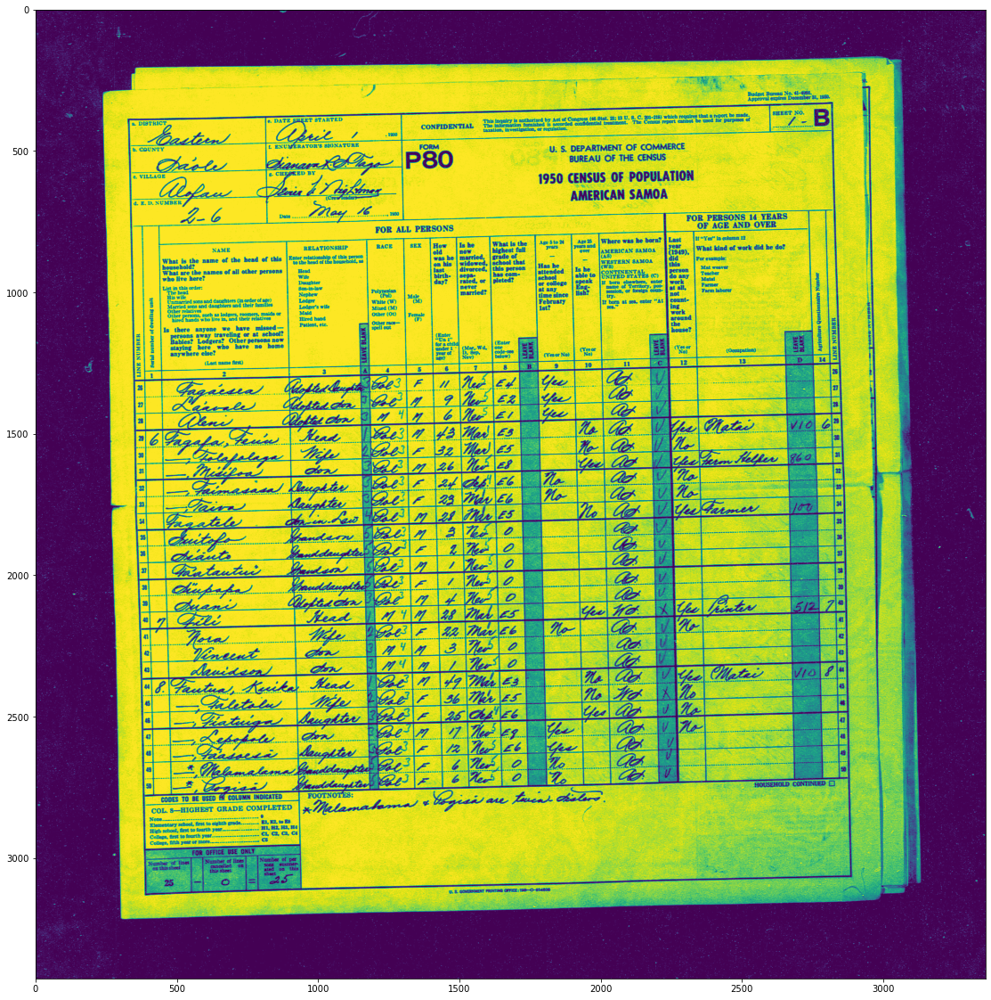

In [45]:
plt.figure(figsize=(20,20))
plt.imshow(gray)

No good!

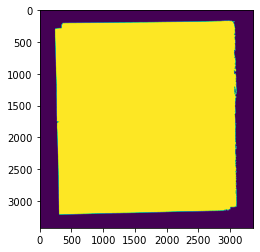

In [54]:
plt.imshow(masked)

In [52]:
masked.shape

(3426, 3362)

In [53]:
3426*3362

11518212

In [56]:
masked.sum()/255

8375547.0

In [59]:
segmented[masked==0] = [255,255,255]

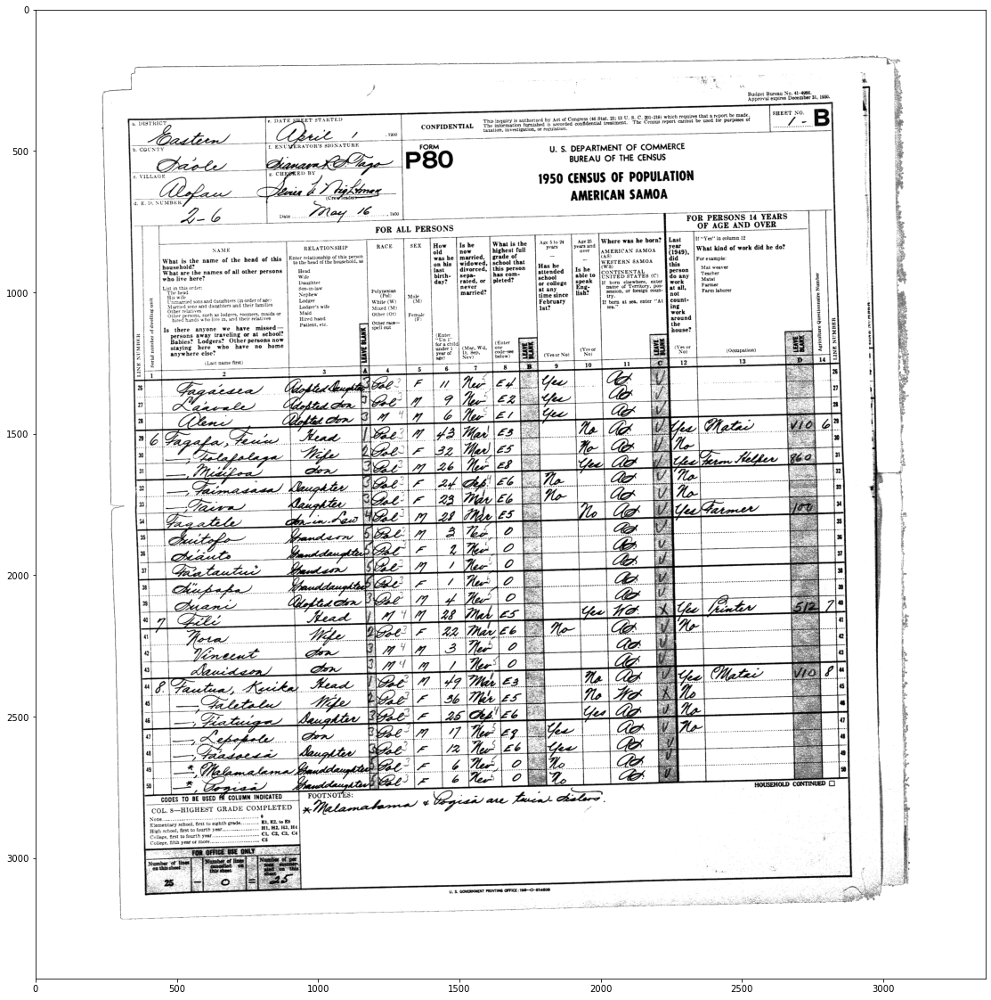

In [62]:
plt.figure(figsize=(20,20))
plt.imshow(segmented);

It's a bit bright, but perhaps by changing the background to white, we'll get a better mean to work with when running the code?

In [71]:
np.mean(segmented),np.mean(gray)

(232.1155270453435, 151.88163206233745)

In [63]:
_,thresh2 = cv2.threshold(segmented, np.mean(segmented), 255, cv2.THRESH_BINARY_INV)
edges2 = cv2.dilate(cv2.Canny(thresh2,0,255), None)

In [64]:
cnt2 = sorted(cv2.findContours(edges2, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[-2], key = cv2.contourArea)[-1]
mask2 = np.zeros(segmented.shape[0:2],np.uint8)
masked2 = cv2.drawContours(mask2, [cnt],-1,255,-1)

In [65]:
dst2 = cv2.bitwise_and(img,img, mask=masked2)
segmented2 = cv2.cvtColor(dst2, cv2.COLOR_BGR2RGB)

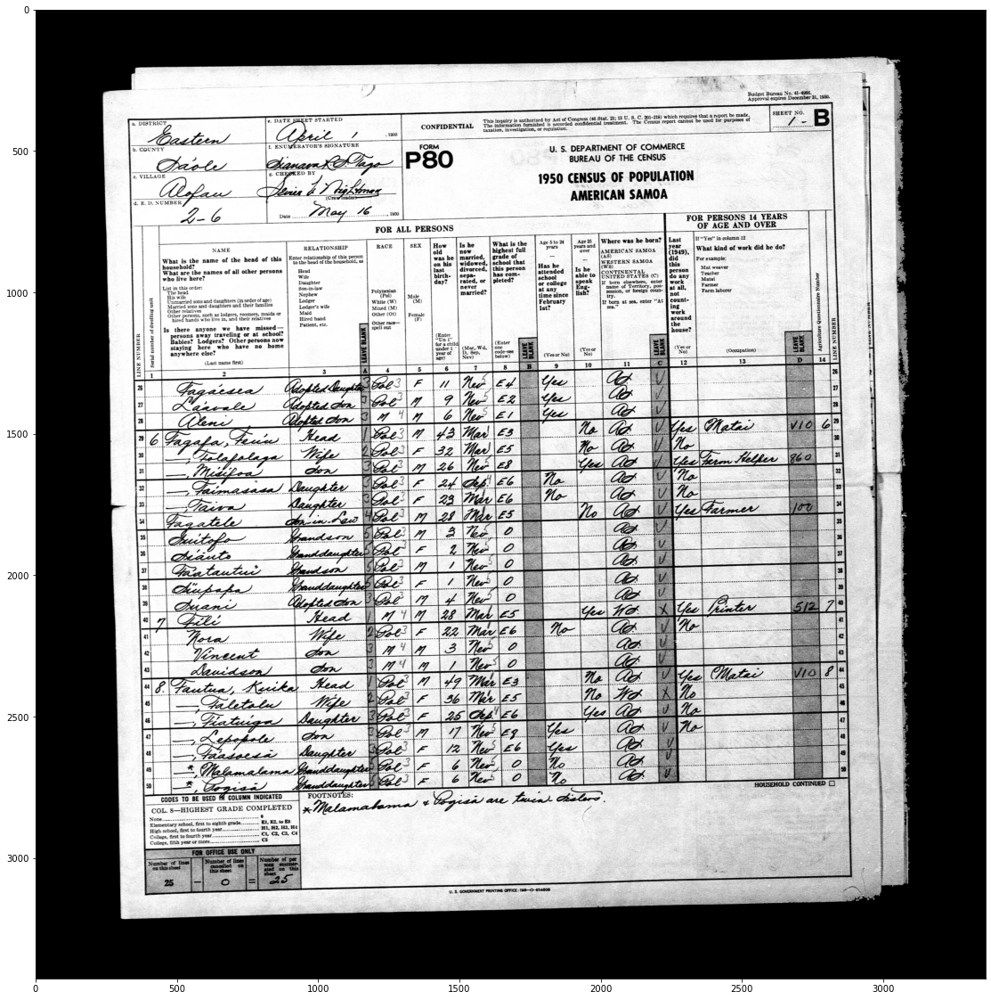

In [66]:
plt.figure(figsize=(20,20))
plt.imshow(segmented2);

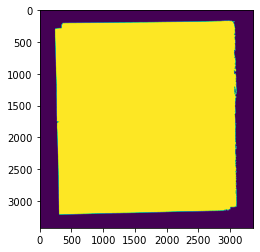

In [69]:
plt.imshow(masked2)

No good! (*2)

In [179]:
lines = cv2.HoughLinesP(edges, 1, np.pi/180, 15, 30, 30, 0)

In [180]:
line_image = np.copy(img)*0

In [181]:
for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),5)

In [182]:
lines_edges = cv2.addWeighted(img,0.8, line_image, 1, 0)

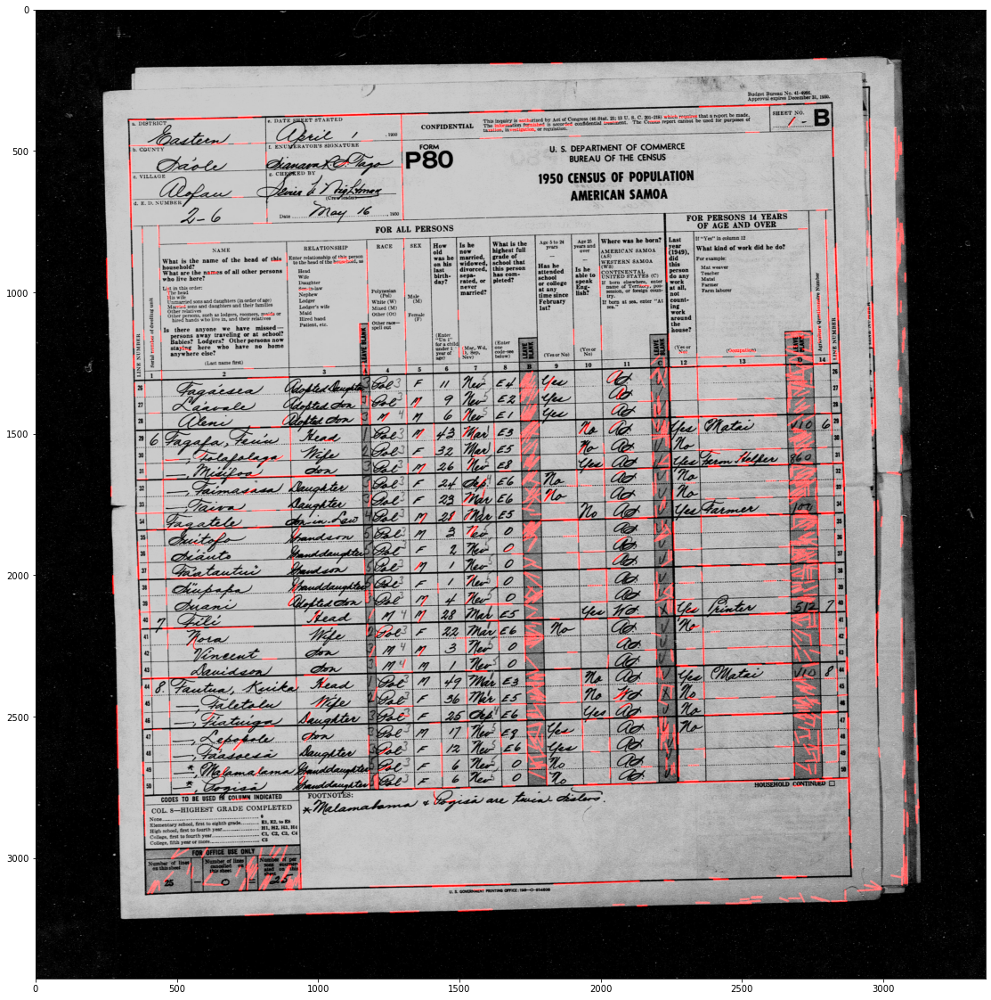

In [183]:
plt.figure(figsize=(20,20))
plt.imshow(lines_edges)

In [157]:
dist = [np.sqrt((x2-x1)**2+(y2-y1)**2) for x1,y1,x2,y2 in lines.reshape(1636,4)]

In [158]:
sum(dist)/len(dist)

59.62205809400819

There's no line length that preserves all the 'real' lines and removes all the useless lines. As such, fwe should use a different tactic

In [184]:
head_path = './data/43290879-American_Samoa/samoa-header.jpg'

In [185]:
head_img=cv2.imread(head_path)

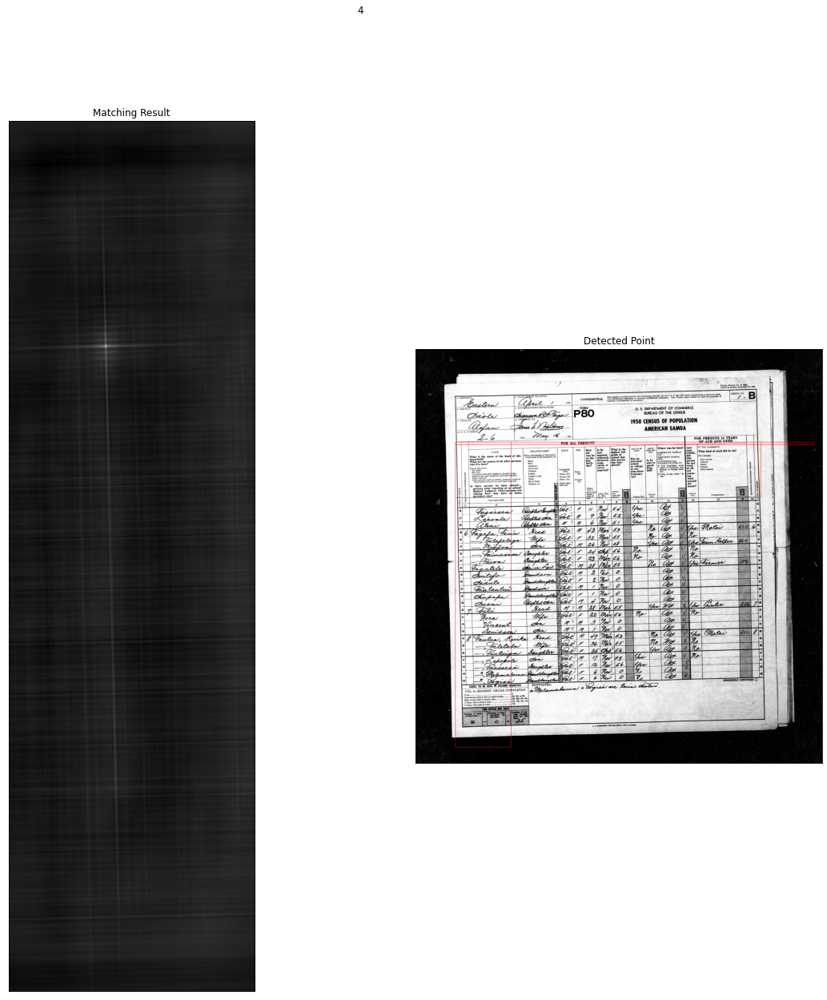

In [205]:
h,w = head_img.shape[0:2]
res = cv2.matchTemplate(img,head_img,cv2.TM_CCOEFF)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
top_left = max_loc
bottom_right = (top_left[1]+w,top_left[0]+h)
cv2.rectangle(img,top_left,bottom_right,255,2)
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(res,cmap='gray')
plt.title('Matching Result'), plt.xticks([]),plt.yticks([])
plt.subplot(122), plt.imshow(img,cmap='gray')
plt.title('Detected Point'), plt.xticks([]),plt.yticks([])
plt.suptitle(cv2.TM_CCOEFF)
plt.show()

In [206]:
top_left

(329, 769)

In [207]:
bottom_right

(3294, 790)

In [203]:
head_img.shape

(461, 2525, 3)

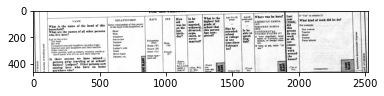

In [204]:
plt.imshow(head_img)